running simulation: 100%|██████████| 5000/5000 [00:14<00:00, 353.30it/s]


System before thermalization

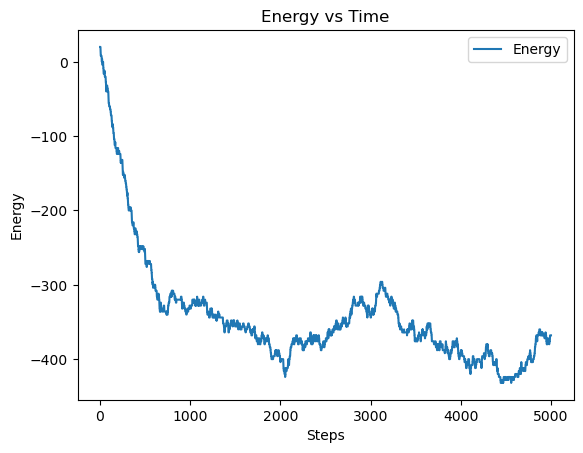

running simulation: 100%|██████████| 50000/50000 [02:03<00:00, 405.66it/s]


System in equilibrium

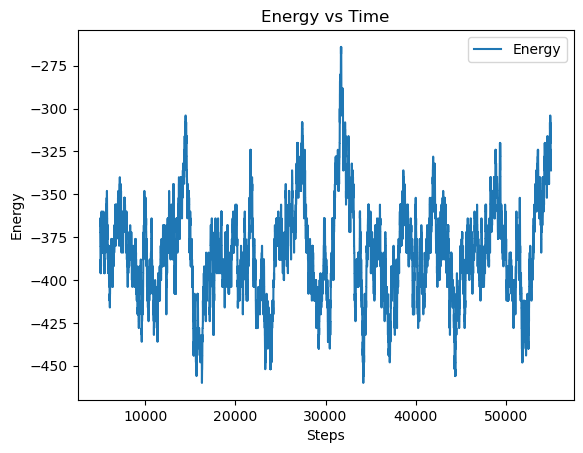

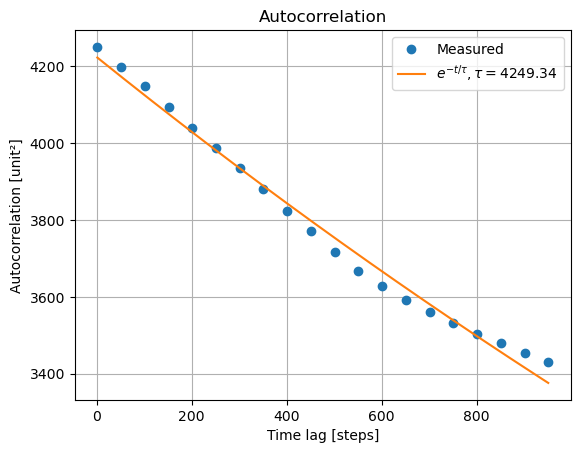

C:\Users\fionu\AppData\Local\Temp\ipykernel_31028\184033224.py:35: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


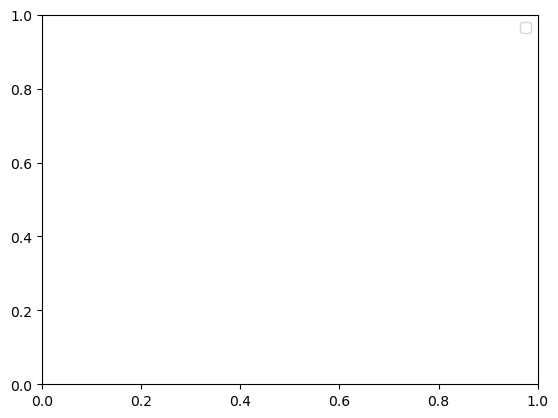

Simulated susceptibility = 3.9335 ± 0.0249

Theoretical susceptibility = 2.2255

$\braket{E}$ = -383.4766 ± 0.1269

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import display, Markdown

import theory
from algorithms import Metropolis
from my_logging import BasisLogger, IsingModelLogger

DYNAMIC_RUNTIME = 5_000
STEADY_RUNTIME = 50_000
SAMPLE_RATE = 1

AUTO_CORR_MAX_SAMPLE = 1_000
AUTO_CORR_SAMPLE_STEP = 50

#initialize the model
model = Metropolis(shape = 1000, beta = 0.4, J = 1, B = 0)

#phase before the system is thermalized
dynamic_logger = IsingModelLogger(sample_rate=SAMPLE_RATE)
model.run_sim(DYNAMIC_RUNTIME, dynamic_logger, progress_bar=True)
display(Markdown("System before thermalization"))
dynamic_logger.plot_energy()
plt.show()

#equilibrium phase
equil_logger = IsingModelLogger(sample_rate=SAMPLE_RATE)
model.run_sim(STEADY_RUNTIME, equil_logger, progress_bar=True)
display(Markdown("System in equilibrium"))
equil_logger.plot_energy()
plt.show()

t_samples = np.arange(SAMPLE_RATE, AUTO_CORR_MAX_SAMPLE, AUTO_CORR_SAMPLE_STEP)
equil_logger.plot_autocorrelations('magnetisation', t_samples=t_samples)
plt.legend()
plt.show()

# Susceptibility and energy
sus = equil_logger.get_susceptibility()
energy = equil_logger.get_energy()

display(Markdown(f"Simulated susceptibility = {sus['mean']:.4f} ± {sus.get('stderr', 0):.4f}"))
display(Markdown(f"Theoretical susceptibility = {theory.susceptibilty_1d(model):.4f}"))
display(Markdown(f"$\\braket{{E}}$ = {energy['mean']:.4f} ± {energy['stderr']:.4f}"))


running simulation: 100%|██████████| 50/50 [00:41<00:00,  1.19it/s]


# While the system is not in equilibrium yet

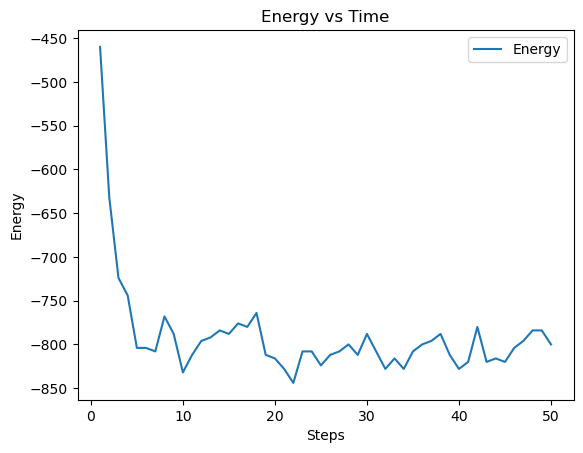

running simulation: 100%|██████████| 1000/1000 [20:20<00:00,  1.22s/it]  


# While the system  in equilibrium

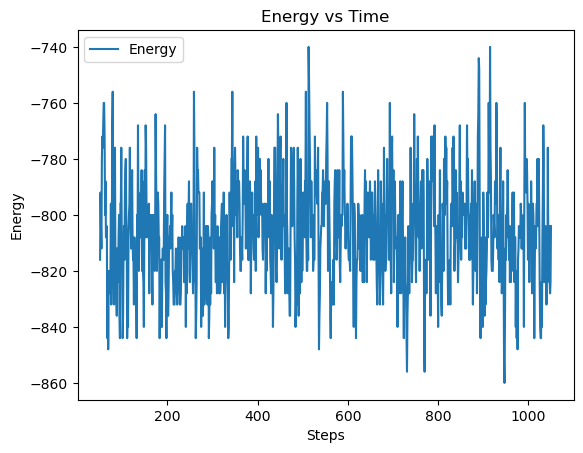

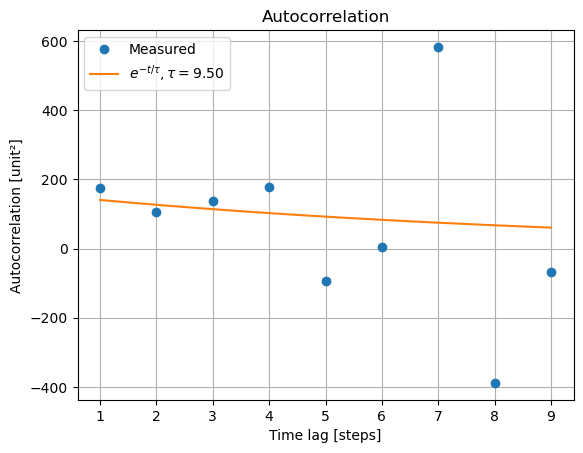

C:\Users\fionu\AppData\Local\Temp\ipykernel_31028\462682262.py:40: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


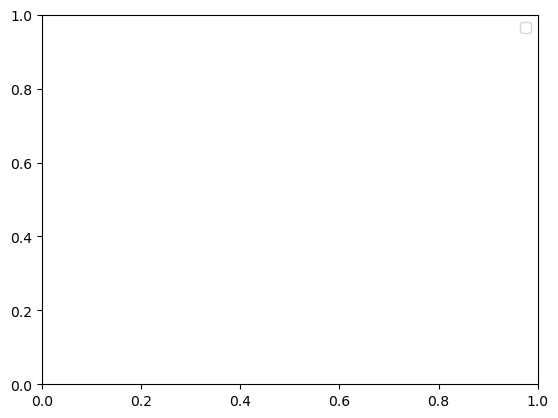

simulated susceptibility = 9.6653 ± 0.4325

theoretical susceptibility = 2.2255

$\langle E \rangle = -806.0720 ± 0.5915$

In [ ]:
from cluster_algorithms import SwendsenWang
from my_logging import IsingModelLogger
import theory

import matplotlib.pyplot as plt
import numpy as np
from IPython.display import display, Markdown

MODEL_SIZE = 1000

DYNAMIC_RUNTIME = 50
STEADY_RUNTIME = 1_000
SAMPLE_RATE = 1

AUTOCORELLATION_MAX_SAMPLE = 10
AUTOCORELLATION_SAMPLE_STEP = 1


model = SwendsenWang(MODEL_SIZE, beta = 0.4,  B= 0, J = 1)

dynamic_state_logger = IsingModelLogger(sample_rate=SAMPLE_RATE)

model.run_sim(DYNAMIC_RUNTIME, dynamic_state_logger, progress_bar=True)

display(Markdown('# While the system is not in equilibrium yet'))

dynamic_state_logger.plot_energy()
plt.show()

steady_state_logger = IsingModelLogger(sample_rate=SAMPLE_RATE)

model.run_sim(STEADY_RUNTIME, steady_state_logger, progress_bar=True)


display(Markdown('# While the system  in equilibrium'))

steady_state_logger.plot_energy()
plt.show()
steady_state_logger.plot_autocorrelations('magnetisation', t_samples=np.arange(SAMPLE_RATE,AUTOCORELLATION_MAX_SAMPLE,AUTOCORELLATION_SAMPLE_STEP))
plt.legend()
plt.show()

sus = steady_state_logger.get_susceptibility()
energy = steady_state_logger.get_energy()

display(Markdown(f"simulated susceptibility = {sus['mean']:.4f} ± {sus.get('stderr', 0):.4f}"))
display(Markdown(f"theoretical susceptibility = {theory.susceptibilty_1d(model):.4f}"))
display(Markdown(f"$\\langle E \\rangle = {energy['mean']:.4f} ± {energy['stderr']:.4f}$"))


running simulation:   0%|          | 0/1000 [00:00<?, ?it/s]

running simulation: 100%|██████████| 1000/1000 [00:02<00:00, 343.42it/s]


# While the system is not in equilibrium yet

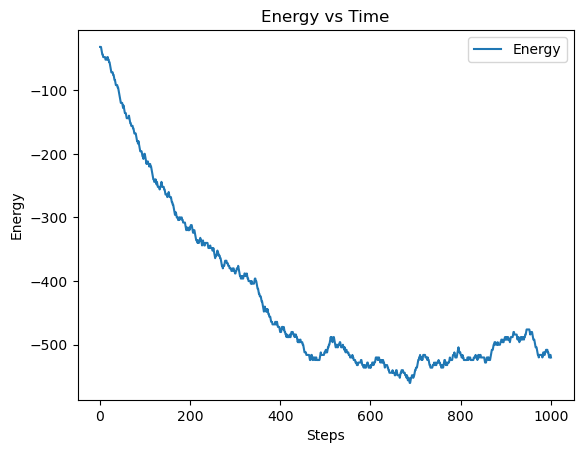

running simulation: 100%|██████████| 10000/10000 [00:49<00:00, 202.78it/s]


# While the system  in equilibrium

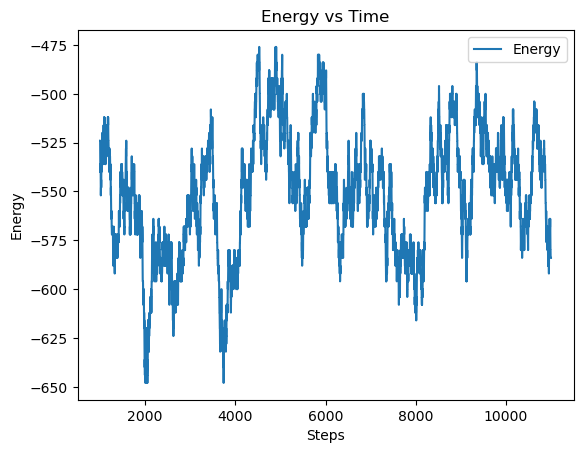

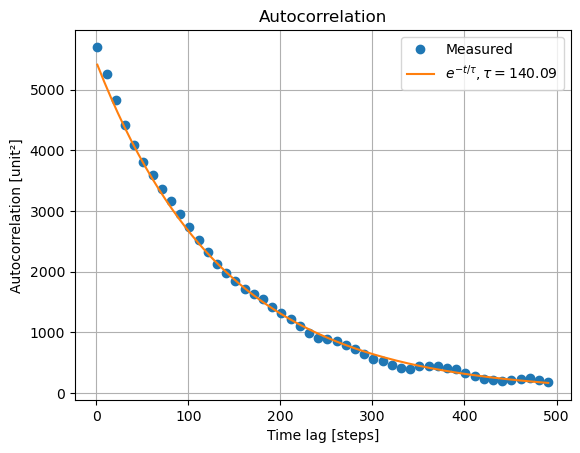

C:\Users\fionu\AppData\Local\Temp\ipykernel_31028\1245211321.py:38: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


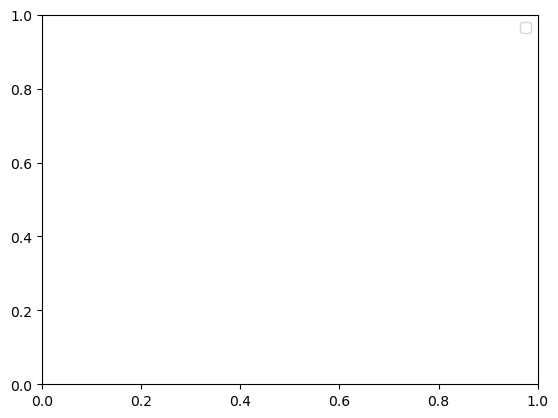

simulated susceptibility = 5.4730 ± 0.0774

theoretical susceptibility = 2.2255

$\langle E \rangle = -551.3988 ± 0.3137$

In [ ]:
from cluster_algorithms import Wolff
from my_logging import IsingModelLogger
import theory

import matplotlib.pyplot as plt
import numpy as np
from IPython.display import display, Markdown

DYNAMIC_RUNTIME = 1000
STEADY_RUNTIME = 10_000
SAMPLE_RATE = 1

AUTOCORELLATION_MAX_SAMPLE = 500
AUTOCORELLATION_SAMPLE_STEP = 10

MODEL_SIZE = 1000

model = Wolff(MODEL_SIZE, beta = 0.4, B = 0, J = 1)

dynamic_state_logger = IsingModelLogger(sample_rate=SAMPLE_RATE)

model.run_sim(DYNAMIC_RUNTIME, dynamic_state_logger, progress_bar=True)

display(Markdown('# While the system is not in equilibrium yet'))
dynamic_state_logger.plot_energy()
plt.show()


steady_state_logger = IsingModelLogger(sample_rate=SAMPLE_RATE)

model.run_sim(STEADY_RUNTIME, steady_state_logger, progress_bar=True)


display(Markdown('# While the system  in equilibrium'))
steady_state_logger.plot_energy()
plt.show()
steady_state_logger.plot_autocorrelations('magnetisation', t_samples=np.arange(SAMPLE_RATE,AUTOCORELLATION_MAX_SAMPLE,AUTOCORELLATION_SAMPLE_STEP))
plt.legend()
plt.show()


sus = steady_state_logger.get_susceptibility()
energy = steady_state_logger.get_energy()

display(Markdown(f"simulated susceptibility = {sus['mean']:.4f} ± {sus.get('stderr', 0):.4f}"))
display(Markdown(f"theoretical susceptibility = {theory.susceptibilty_1d(model):.4f}"))
display(Markdown(f"$\\langle E \\rangle = {energy['mean']:.4f} ± {energy['stderr']:.4f}$"))

# Overview of the diffrent algorithms

## Animation of the Metroplis algorithm
every frame shows 50 iterations

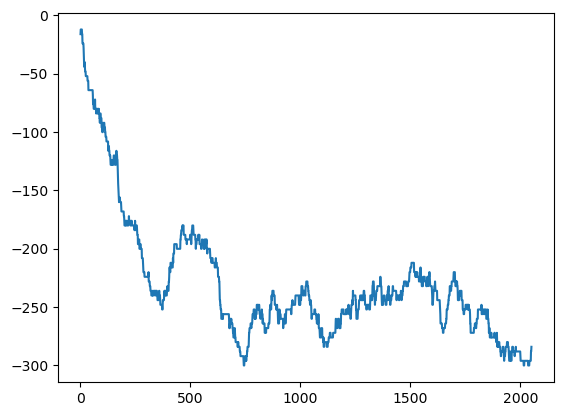

## Animation of the SwendsenWang algorithm
every frame shows 1 iteration

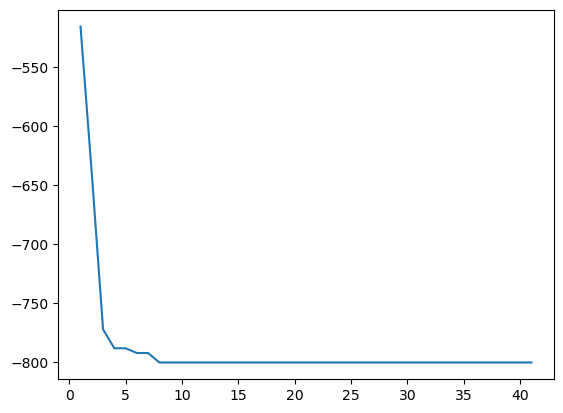

## Animation of the Wolff algorithm
every frame shows 1 iteration

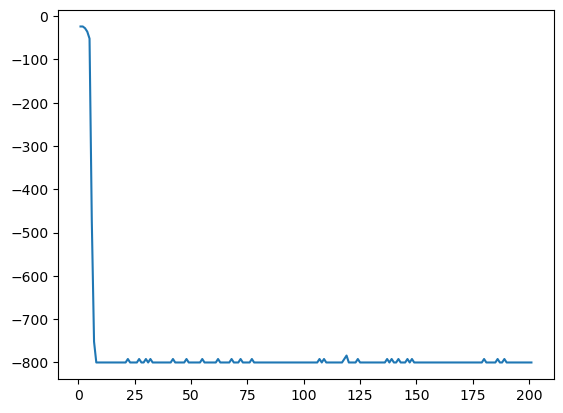

In [1]:
from cluster_algorithms import Wolff, SwendsenWang
from my_logging import IsingModelLogger
import theory
from algorithms import Metropolis

import matplotlib.pyplot as plt
import numpy as np
from IPython.display import display, Markdown

SHOWCASE_J = 1
SHOWCASE_BETA = 0.3
SHOWCASE_MODEL_SIZE = [20,20]

models = [
    Metropolis(     SHOWCASE_MODEL_SIZE, J = SHOWCASE_J, beta=SHOWCASE_BETA, B = 0), 
    SwendsenWang(   SHOWCASE_MODEL_SIZE, J = SHOWCASE_J, beta=SHOWCASE_BETA, B = 0), 
    Wolff(          SHOWCASE_MODEL_SIZE, J = SHOWCASE_J, beta=SHOWCASE_BETA, B = 0)
    ]
animation_parameters = [
    (2000, 50, 20),
    (40, 1, 5),
    (200, 1, 10)
    ]
descriptions = [
    Markdown('## Animation of the Metroplis algorithm\nevery frame shows 50 iterations'),
    Markdown('## Animation of the SwendsenWang algorithm\nevery frame shows 1 iteration'),
    Markdown('## Animation of the Wolff algorithm\nevery frame shows 1 iteration')
]

display(Markdown('# Overview of the diffrent algorithms'))

for model, params, description in zip(models, animation_parameters, descriptions):
    display(description)
    logger = IsingModelLogger()
    display(model.animate(*params, logger))
    plt.plot(logger['t'], logger['E'])
    plt.show()

metro3D = Metropolis([8,8,8],0.02,1,0.4)

display(metro3D.animate(10_000))
